In [0]:
%matplotlib inline
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

In [0]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
from google.colab import files
files.upload()
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d jessicali9530/celeba-dataset

celeba-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [0]:
!unzip -q ./celeba-dataset.zip

replace img_align_celeba/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [0]:
batch_size = 128
dataset = datasets.ImageFolder(root='./img_align_celeba/',
                               transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=2)

torch.Size([128, 3, 64, 64]) torch.Size([128])


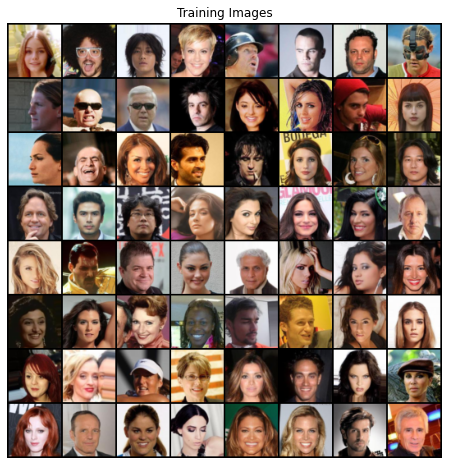

In [0]:
real_batch = next(iter(dataloader))
print(real_batch[0].shape, real_batch[1].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
class Generator(nn.Module):
  """ Generator Network as proposed in the paper. """
  def __init__(self):
    super().__init__()
    in_channels = 100
    self.conv1 = nn.Sequential(
        nn.ConvTranspose2d(in_channels, 1024, 4),
        nn.BatchNorm2d(1024),
        nn.ReLU(),
    )
    self.conv2 = nn.Sequential(
        nn.ConvTranspose2d(1024, 512, 4, 2, 1),
        nn.BatchNorm2d(512),
        nn.ReLU(),
    )
    self.conv3 = nn.Sequential(
        nn.ConvTranspose2d(512, 256, 4, 2, 1),
        nn.BatchNorm2d(256),
        nn.ReLU(),
    )
    self.conv4 = nn.Sequential(
        nn.ConvTranspose2d(256, 128, 4, 2, 1),
        nn.BatchNorm2d(128),
        nn.ReLU(),
    )
    self.conv5 = nn.Sequential(
        nn.ConvTranspose2d(128, 3, 4, 2, 1),
        nn.Tanh(),
    )

  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = self.conv4(x)
    x = self.conv5(x)
    return x

In [0]:
def weights_init(m):
  """ Weights initialization as proposed in the paper. """
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
      nn.init.normal_(m.weight.data, 0.0, 0.02)
      nn.init.constant_(m.bias.data, 0)
      
  elif classname.find('BatchNorm') != -1:
      nn.init.normal_(m.weight.data, 1.0, 0.02)
      nn.init.constant_(m.bias.data, 0)

In [0]:
gen = Generator().to(device)
gen.apply(weights_init)
print(gen)

Generator(
  (conv1): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv3): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv4): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv5): Sequential(
    (0): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): Tanh()
  )

In [0]:
from torchsummary import summary
summary(gen, (100,1,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       1,639,424
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 8, 8]       8,389,120
       BatchNorm2d-5            [-1, 512, 8, 8]           1,024
              ReLU-6            [-1, 512, 8, 8]               0
   ConvTranspose2d-7          [-1, 256, 16, 16]       2,097,408
       BatchNorm2d-8          [-1, 256, 16, 16]             512
              ReLU-9          [-1, 256, 16, 16]               0
  ConvTranspose2d-10          [-1, 128, 32, 32]         524,416
      BatchNorm2d-11          [-1, 128, 32, 32]             256
             ReLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           6,147
             Tanh-14            [-1, 3,

In [0]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(512, 1, 4, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        return x

In [0]:
disc = Discriminator().to(device)
disc.apply(weights_init)
summary(disc,(3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,136
         LeakyReLU-2           [-1, 64, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         131,200
       BatchNorm2d-4          [-1, 128, 16, 16]             256
         LeakyReLU-5          [-1, 128, 16, 16]               0
            Conv2d-6            [-1, 256, 8, 8]         524,544
       BatchNorm2d-7            [-1, 256, 8, 8]             512
         LeakyReLU-8            [-1, 256, 8, 8]               0
            Conv2d-9            [-1, 512, 4, 4]       2,097,664
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
        LeakyReLU-11            [-1, 512, 4, 4]               0
           Conv2d-12              [-1, 1, 1, 1]           8,193
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 2,766,529
Trainable param

In [0]:
criterion = nn.BCELoss()
test_noise = torch.randn(64, 100, 1, 1, device=device)
real_label = 1
fake_label = 0
lr = 0.0002
beta1 = 0.5
optimD = optim.Adam(disc.parameters(), lr=lr, betas=(beta1, 0.999))
optimG = optim.Adam(gen.parameters(), lr=lr, betas=(beta1, 0.999))

In [0]:
import time
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 5
total_time = 0.0

for epoch in range(num_epochs):

  for i, data in enumerate(dataloader, 0):

    start_time = time.time()
    disc.zero_grad()
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, device=device)

    output = disc(real_cpu).view(-1)
    del real_cpu
    errD_real = criterion(output, label)
    errD_real.backward()
    D_x = output.mean().item()

    noise = torch.randn(b_size, 100, 1, 1, device=device)
    fake = gen(noise)
    label.fill_(fake_label)

    output = disc(fake.detach()).view(-1)
    errD_fake = criterion(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    errD = errD_real.item() + errD_fake.item()
    del errD_real, errD_fake

    optimD.step()

    gen.zero_grad()
    label.fill_(real_label)

    output = disc(fake).view(-1)
    errGx = criterion(output, label)
    errGx.backward()
    D_G_z2 = output.mean().item()
    errG = errGx.item()
    del errGx

    optimG.step()
    el_time = time.time() - start_time
    total_time += el_time
    if i % 250 == 0:
      print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f\tTime: %.2f s' #Time per batch
            % (epoch, num_epochs, i, len(dataloader),
                errD, errG, D_x, D_G_z1, D_G_z2, el_time))

    G_losses.append(errG)
    D_losses.append(errD)
    del errG, errD, D_x, D_G_z1, D_G_z2

    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
      with torch.no_grad():
        fake = gen(test_noise).detach().cpu()
      img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))
    
    del el_time, output, label, fake, noise
    iters += 1
  
  print(f'Time Elapsed : {total_time : .2f} s')

/pytorch/aten/src/ATen/native/TensorFactories.cpp:361: UserWarning: Deprecation warning: In a future PyTorch release torch.full will no longer return tensors of floating dtype by default. Instead, a bool fill_value will return a tensor of torch.bool dtype, and an integral fill_value will return a tensor of torch.long dtype. Set the optional `dtype` or `out` arguments to suppress this warning.


[0/5][0/1583]	Loss_D: 1.9061	Loss_G: 1.9229	D(x): 0.2649	D(G(z)): 0.2640 / 0.1888	Time: 0.42 s
[0/5][250/1583]	Loss_D: 0.6403	Loss_G: 3.3942	D(x): 0.8587	D(G(z)): 0.3228 / 0.0608	Time: 0.36 s
[0/5][500/1583]	Loss_D: 1.2107	Loss_G: 4.4007	D(x): 0.7955	D(G(z)): 0.5499 / 0.0229	Time: 0.37 s
[0/5][750/1583]	Loss_D: 0.7767	Loss_G: 3.2118	D(x): 0.7540	D(G(z)): 0.3182 / 0.0666	Time: 0.37 s
[0/5][1000/1583]	Loss_D: 1.0695	Loss_G: 2.1328	D(x): 0.5700	D(G(z)): 0.2952 / 0.1661	Time: 0.37 s
[0/5][1250/1583]	Loss_D: 1.0057	Loss_G: 2.5010	D(x): 0.7121	D(G(z)): 0.4060 / 0.1057	Time: 0.37 s
[0/5][1500/1583]	Loss_D: 0.7161	Loss_G: 3.0084	D(x): 0.8064	D(G(z)): 0.3525 / 0.0637	Time: 0.37 s
Time Elapsed :  584.19 s
[1/5][0/1583]	Loss_D: 0.9374	Loss_G: 2.8901	D(x): 0.7763	D(G(z)): 0.4266 / 0.0724	Time: 0.36 s
[1/5][250/1583]	Loss_D: 0.7980	Loss_G: 2.9997	D(x): 0.7878	D(G(z)): 0.3797 / 0.0694	Time: 0.37 s
[1/5][500/1583]	Loss_D: 0.6428	Loss_G: 2.8928	D(x): 0.8154	D(G(z)): 0.3195 / 0.0766	Time: 0.37 s
[1/5][

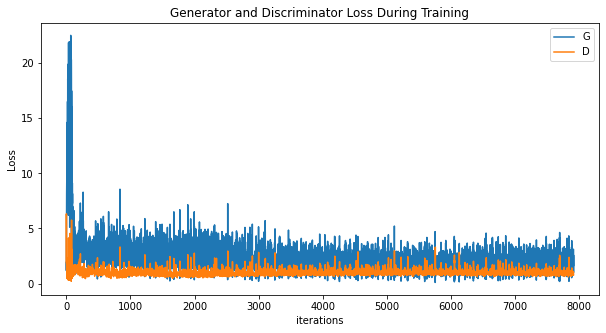

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

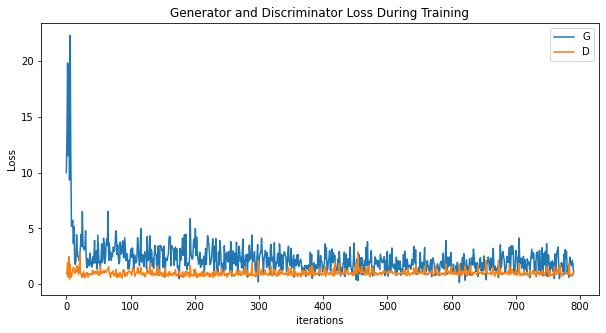

In [0]:
G_losses1 = []
D_losses1 = []
i = 10
while i < iters:
  G_losses1.append(G_losses[i])
  D_losses1.append(D_losses[i])
  i += 10

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses1,label="G")
plt.plot(D_losses1,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

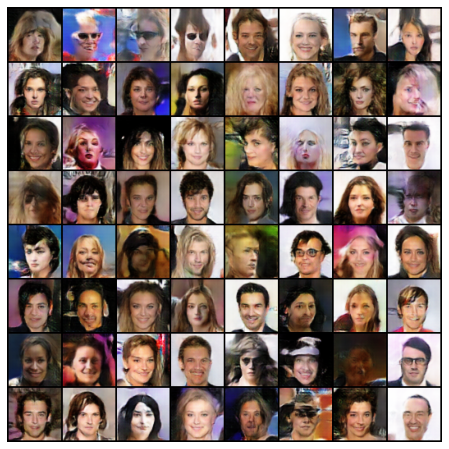

In [0]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

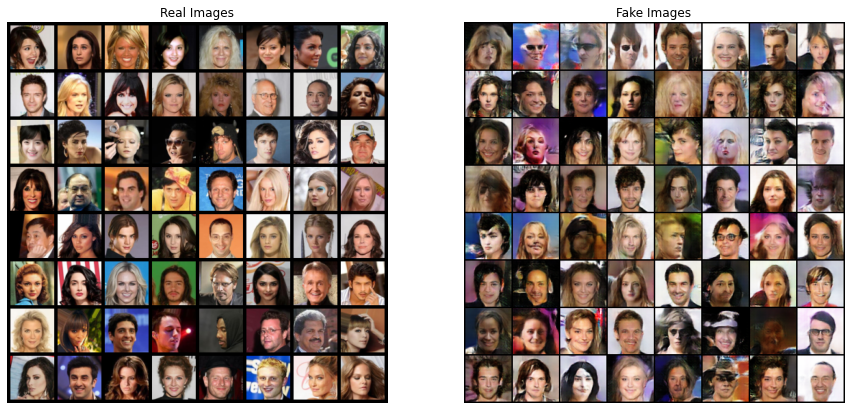

In [0]:

real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], 
                                                    padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [0]:
torch.save(gen.state_dict(), './gen.pt')
torch.save(disc.state_dict(), './disc.pt')